In [1]:
import rasterio as ro
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import random
import math
import pandas
from scipy import optimize

#from keras_tuner.engine.hyperparameters import HyperParameters

from scipy.signal import savgol_filter

In [2]:
# load the data
ndvi = ro.open("Data/NDVI.grd")

covariates = ro.open("Data/covariates_250m_peninsula.grd")

p1 = ro.open("Data/newprec_01.tif")

p7 = ro.open("Data/newprec_07.tif")

fire_history = ro.open("Data/age.grd")

qa_data = ro.open("Data/QA.grd")

In [3]:
# read the shape of covariates
covariates_arr = covariates.read()

np.shape(covariates_arr)

(12, 172, 63)

In [4]:
# read the shape of NDVI
ndvi_arr = ndvi.read()

np.shape(ndvi_arr)

(748, 172, 63)

In [5]:
# read the shape of QA
qa_arr = qa_data.read()

np.shape(qa_arr)

(748, 172, 63)

In [6]:
# read the shape of fire history
fire_arr = fire_history.read()
fire_arr.shape

(748, 172, 63)

In [7]:
fire_arr[0]

array([[   nan,    nan,    nan, ...,    nan,    nan,    nan],
       [   nan,    nan,    nan, ...,    nan,    nan,    nan],
       [   nan,    nan,    nan, ...,    nan,    nan,    nan],
       ...,
       [   nan,    nan,    nan, ...,  2784.,  2784., 14658.],
       [   nan,    nan,    nan, ...,  2784.,  2784., 14658.],
       [   nan,    nan,    nan, ..., 14658., 14658., 14658.]],
      dtype=float32)

In [8]:
# read the precipitation data
p1_arr = p1.read()
p1_arr.shape
p7_arr = p7.read()
p7_arr.shape

p1_arr = p1_arr[:,:172,:63]

p7_arr = p7_arr[:,:172,:63]

In [9]:
p1_arr[p1_arr<0] = np.nan 
p7_arr[p7_arr<0] = np.nan 

In [10]:
# replace the precipitation value
covariates_arr[9] = p1_arr
covariates_arr[10] = p7_arr

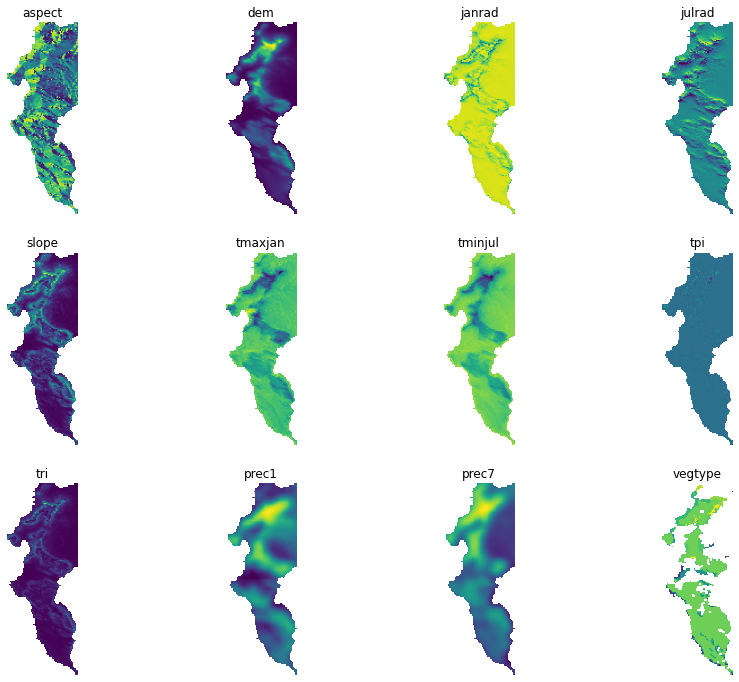

In [11]:
# Visualize the environment covariates
plt.figure(figsize=(15,12))
for i in range(12):
    plt.subplot(3,4,i+1)
    plt.title(covariates.descriptions[i])
    plt.imshow(covariates_arr[i])
    plt.axis('off')

In [12]:
# read the shape of new covariates 
np.shape(covariates_arr)

(12, 172, 63)

In [13]:
# What is the value range of the environmental variables?
for i in range(covariates_arr.shape[0]):
    layer_name = covariates.descriptions[i]
    min_value = np.nanmin(covariates_arr[i])
    max_value = np.nanmax(covariates_arr[i])
    mean_value = np.nanmean(covariates_arr[i])
    print(layer_name+": min: "+str(min_value)+", max: "+str(max_value)+", mean: "+str(mean_value)+"\n")

aspect: min: 0.025960453, max: 6.2611136, mean: 3.0046475

dem: min: -1.2942011, max: 1069.7134, mean: 172.9334

janrad: min: 4004.0354, max: 9311.947, mean: 8741.644

julrad: min: 471.11484, max: 6528.9673, mean: 3281.7493

slope: min: 6.7596327e-22, max: 1.2136732, mean: 0.2010844

tmaxjan: min: 21.831682, max: 31.777122, mean: 28.34501

tminjul: min: 3.6588407, max: 11.716162, mean: 9.477635

tpi: min: -25.07602, max: 42.91772, mean: 0.050585095

tri: min: 1.2236242e-19, max: 244.41881, mean: 17.412844

prec1: min: 16.0, max: 32.981983, mean: 22.70195

prec7: min: 80.15998, max: 169.64435, mean: 117.04249

vegtype: min: 2.0, max: 20.0, mean: 14.957029



In [14]:
def MaxMinNormalization(x, norm_min, norm_max):
    """（0,1] normaliaztion"""
    x = (x - norm_min) / (norm_max - norm_min)
    return x

In [15]:
# normalize the covariate data
norm_covariates = np.zeros(covariates_arr.shape)
for i in range(12):
    norm_covariates[i] = MaxMinNormalization(covariates_arr[i],np.nanmin(covariates_arr[i])-1,np.nanmax(covariates_arr[i])+1)
print(norm_covariates.shape)

(12, 172, 63)


In [16]:
# normalize the fire history data
norm_fire = np.zeros(fire_arr.shape)
for i in range(748):
    norm_fire[i] = MaxMinNormalization(fire_arr[i],np.nanmin(fire_arr[i])-1,np.nanmax(fire_arr[i])+7300)
print(norm_fire.shape)

(748, 172, 63)


In [17]:
norm_fire[0]

array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [       nan,        nan,        nan, ..., 0.12615076, 0.12615076,
        0.66730469],
       [       nan,        nan,        nan, ..., 0.12615076, 0.12615076,
        0.66730469],
       [       nan,        nan,        nan, ..., 0.66730469, 0.66730469,
        0.66730469]])

In [18]:
# What is the value range of the NORMALIZED environmental variables?
for i in range(norm_covariates.shape[0]):
    layer_name = covariates.descriptions[i]
    min_value = np.nanmin(norm_covariates[i])
    max_value = np.nanmax(norm_covariates[i])
    mean_value = np.nanmean(norm_covariates[i])
    print(layer_name+": min: "+str(min_value)+", max: "+str(max_value)+", mean: "+str(mean_value)+"\n")

aspect: min: 0.1214306503534317, max: 0.8785693645477295, mean: 0.48313456580264563

dem: min: 0.0009319598902948201, max: 0.999068021774292, mean: 0.16330510320843938

janrad: min: 0.00018832703062798828, max: 0.9998116493225098, mean: 0.8924082571804849

julrad: min: 0.00016502052312716842, max: 0.9998349547386169, mean: 0.4639774106588817

slope: min: 0.31117042899131775, max: 0.6888296008110046, mean: 0.3737419339288029

tmaxjan: min: 0.08371394872665405, max: 0.916286051273346, mean: 0.6289705463014474

tminjul: min: 0.09943005442619324, max: 0.9005699753761292, mean: 0.6779932413030669

tpi: min: 0.014286991208791733, max: 0.985713005065918, mean: 0.37327056577691187

tri: min: 0.0040581319481134415, max: 0.9959418773651123, mean: 0.07472174343360968

prec1: min: 0.052681535482406616, max: 0.9473184943199158, mean: 0.40575049582622397

prec7: min: 0.010930829681456089, max: 0.9890691637992859, mean: 0.4140873334682927

vegtype: min: 0.05000000074505806, max: 0.949999988079071, me

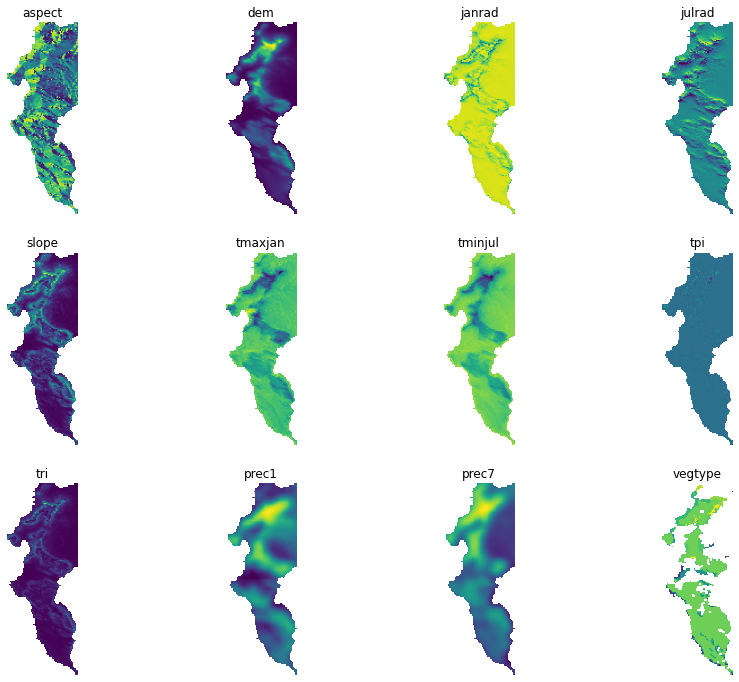

In [19]:
# Visualize the NORMALIZED environment covariates
plt.figure(figsize=(15,12))
for i in range(12):
    plt.subplot(3,4,i+1)
    plt.title(covariates.descriptions[i])
    plt.imshow(norm_covariates[i])
    plt.axis('off')

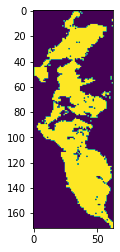

In [20]:
# create a mask based on the environmental variables and fire history
study_region_mask = np.zeros((ndvi.height,ndvi.width))


for i in range(study_region_mask.shape[0]):
    for j in range(study_region_mask.shape[1]):
        found_nan = False
        for var_index in range(covariates_arr.shape[0]):
            if np.isnan(covariates_arr[var_index,i,j]):
                found_nan =True
                break

        for time_step in range(fire_arr.shape[0]):
            if np.isnan(fire_arr[time_step,i,j]):
                found_nan =True
                break
        
        if found_nan:
            study_region_mask[i,j] = -1
        else:
            study_region_mask[i,j] = 1

plt.imshow(study_region_mask)

In [21]:
nan_value = 0

In [22]:
# a mask out function
def mask_layer(input_layer, mask_layer):
    # for i in range(mask_layer.shape[0]):
    #     for j in range(mask_layer.shape[1]):
    #         if mask_layer[i,j]==-1:
    #             input_layer[i,j] = nan_value # replace the nan value in the input data
    input_layer[mask_layer==-1] = nan_value

    return input_layer

In [23]:
#savgol_filter to smooth the data
#ndvi_times = range(1,ndvi.count+1)

qa_value_array = qa_data.read()

#ndvi_smoothed = []
smoothed_dataset = np.zeros((ndvi.count,ndvi.height,ndvi.width))

for m in range(0,ndvi.height):
  for n in range(0,ndvi.width):

    ndvi_ori = ndvi_arr[:,m,n]
    
    if study_region_mask[m,n] ==-1:
      #ndvi_smoothed.append(ndvi_ori)
      smoothed_dataset[:,m,n] = ndvi_ori
      continue
    
    
    qa_value = qa_arr[:,m,n]
    # for i in ndvi_times:
    #   ndvi_data = ndvi.read(i)
    #   ndvi_pixel = ndvi_data[m,n]
    #   ndvi_ori.append(ndvi_pixel) #将每个像素上所有时间点上的值存入数组


    #   qa = qa_data.read(i)
    #   qa_pixel = qa[m,n]
    #   qa_value.append(qa_pixel) #将每个像素上所有时间点上的QA值存入数组

    smoothed = savgol_filter(ndvi_ori,7,2)

    for t in range(qa_value.shape[0]):
      if qa_value[t] == 0 and ndvi_ori[t]>0:
        smoothed[t] = ndvi_ori[t]
      # else:
      #   pass

    #ndvi_smoothed.append(smoothed)
    smoothed_dataset[:,m,n] = smoothed


#ndvi_smoothed = np.asarray(ndvi_smoothed)

In [24]:
#np.shape(ndvi_smoothed)

In [25]:
# created the dataset contains ONLY SMOOTHED NDVI DATA
# smoothed_dataset = np.zeros((ndvi.count,ndvi.height,ndvi.width))
# for time_steps in range(0,ndvi.count):
#   for m in range(0,ndvi.height):
#     for n in range(0,ndvi.width):
#       smoothed_dataset[time_steps,m,n] = ndvi_smoothed[63*m+n][time_steps]

print(np.shape(smoothed_dataset))

(748, 172, 63)


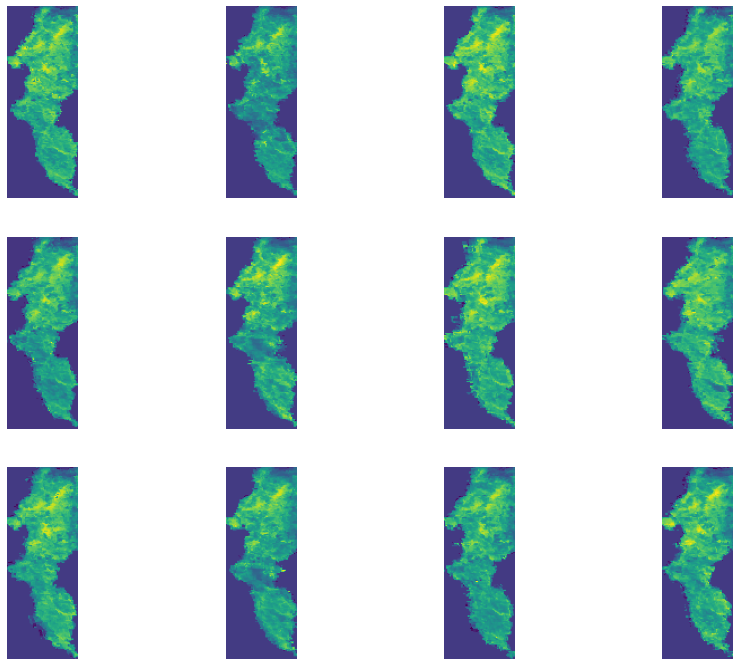

In [26]:
# visualize random 12 NDVI values of SMOOTHED NDVI DATASET
plt.figure(figsize=(15,12))
for i in range(1,13):
    plt.subplot(3,4,i)
    random_time = random.randint(0,ndvi.count-1)
    plt.imshow(smoothed_dataset[random_time,:,:])
    plt.axis('off')

In [27]:
# create multi_input dataset
norm_smoothed_dataset = np.zeros((ndvi.count,ndvi.height,ndvi.width,13))

for time_steps in range(0,ndvi.count):
    norm_smoothed_dataset[time_steps,:,:,0] = smoothed_dataset[time_steps,:,:] #NDVI

    norm_smoothed_dataset[time_steps,:,:,1] = norm_covariates[0,:,:] # aspect
    norm_smoothed_dataset[time_steps,:,:,2] = norm_covariates[1,:,:] # DEM
    norm_smoothed_dataset[time_steps,:,:,3] = norm_covariates[2,:,:] # janrad
    norm_smoothed_dataset[time_steps,:,:,4] = norm_covariates[3,:,:] # julrad
    #norm_smoothed_dataset[time_steps,:,:,4] = norm_covariates[4,:,:] # slope
    norm_smoothed_dataset[time_steps,:,:,5] = norm_covariates[5,:,:] # tmaxjan
    norm_smoothed_dataset[time_steps,:,:,6] = norm_covariates[6,:,:] # tmaxjul
    norm_smoothed_dataset[time_steps,:,:,7] = norm_covariates[7,:,:] # tpi
    norm_smoothed_dataset[time_steps,:,:,8] = norm_covariates[8,:,:] # tri
    norm_smoothed_dataset[time_steps,:,:,9] = norm_covariates[9,:,:] # prec1
    norm_smoothed_dataset[time_steps,:,:,10] = norm_covariates[10,:,:] # prec7
    norm_smoothed_dataset[time_steps,:,:,11] = norm_covariates[11,:,:] # vegtype
 
    norm_smoothed_dataset[time_steps,:,:,12] = norm_fire[time_steps,:,:]               


print(norm_smoothed_dataset.shape)


(748, 172, 63, 13)


In [28]:
# What is the value range of the NORMALIZED SMOOTHED dataset before the mask
for i in range(1,12):
    layer_name = int(i)
    min_value = np.nanmin(norm_smoothed_dataset[:,:,:,i])
    max_value = np.nanmax(norm_smoothed_dataset[:,:,:,i])
    mean_value = np.nanmean(norm_smoothed_dataset[:,:,:,i])
    print(str(layer_name)+": min: "+str(min_value)+", max: "+str(max_value)+", mean: "+str(mean_value)+"\n")

1: min: 0.1214306503534317, max: 0.8785693645477295, mean: 0.48313456580264563

2: min: 0.0009319598902948201, max: 0.999068021774292, mean: 0.16330510320844016

3: min: 0.00018832703062798828, max: 0.9998116493225098, mean: 0.8924082571804762

4: min: 0.00016502052312716842, max: 0.9998349547386169, mean: 0.46397741065888853

5: min: 0.08371394872665405, max: 0.916286051273346, mean: 0.6289705463014474

6: min: 0.09943005442619324, max: 0.9005699753761292, mean: 0.6779932413030669

7: min: 0.014286991208791733, max: 0.985713005065918, mean: 0.37327056577691187

8: min: 0.0040581319481134415, max: 0.9959418773651123, mean: 0.07472174343360968

9: min: 0.052681535482406616, max: 0.9473184943199158, mean: 0.40575049582622397

10: min: 0.010930829681456089, max: 0.9890691637992859, mean: 0.4140873334682927

11: min: 0.05000000074505806, max: 0.949999988079071, mean: 0.6978514697602813



In [29]:
# filter the multi_input dataset with the mask
for time_steps in range(0,norm_smoothed_dataset.shape[0]):
    norm_smoothed_dataset[time_steps,:,:,:] = mask_layer(norm_smoothed_dataset[time_steps,:,:,:],study_region_mask)

print(norm_smoothed_dataset.shape)

(748, 172, 63, 13)


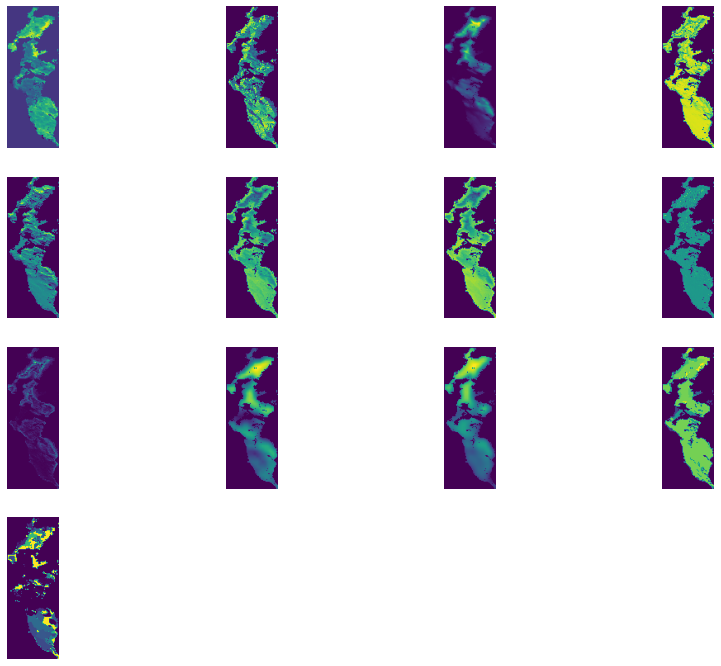

In [30]:
# Visualize the NORMALIZED and masked variables
plt.figure(figsize=(15,12))
figure_names = ["NDVI"]
for i in range(11):
    figure_names.append(covariates.descriptions[i+1])
figure_names.append("Fire age")

for i in range(13):
    plt.subplot(4,4,i+1)
    #plt.title(figure_names[i])
    plt.imshow(norm_smoothed_dataset[0,:,:,i])
    plt.axis('off')

In [31]:
# What is the value range of the NORMALIZED SMOOTHED dataset after the mask
for i in range(1,12):
    layer_name = int(i)
    min_value = np.nanmin(norm_smoothed_dataset[:,:,:,i])
    max_value = np.nanmax(norm_smoothed_dataset[:,:,:,i])
    mean_value = np.nanmean(norm_smoothed_dataset[:,:,:,i])
    print(str(layer_name)+": min: "+str(min_value)+", max: "+str(max_value)+", mean: "+str(mean_value)+"\n")

1: min: 0.0, max: 0.8766118288040161, mean: 0.1871742860126337

2: min: 0.0, max: 0.999068021774292, mean: 0.0878697360836163

3: min: 0.0, max: 0.9998116493225098, mean: 0.3309629230098933

4: min: 0.0, max: 0.9998349547386169, mean: 0.1728341373142324

5: min: 0.0, max: 0.9015579223632812, mean: 0.22608281924479032

6: min: 0.0, max: 0.8692363500595093, mean: 0.24528126100173797

7: min: 0.0, max: 0.6976239681243896, mean: 0.14182202577745304

8: min: 0.0, max: 0.9333016872406006, mean: 0.03708200562367509

9: min: 0.0, max: 0.9473184943199158, mean: 0.16720470398404572

10: min: 0.0, max: 0.9890691637992859, mean: 0.17955702709961627

11: min: 0.0, max: 0.949999988079071, mean: 0.26781099983558043



In [32]:
min_value = np.nanmin(norm_smoothed_dataset[:,:,:,0])
max_value = np.nanmax(norm_smoothed_dataset[:,:,:,0])

print(min_value)
print(max_value)

-0.164983332157135
1.0152380466461182


In [33]:
min_value = np.nanmin(norm_smoothed_dataset[:,:,:,12])
max_value = np.nanmax(norm_smoothed_dataset[:,:,:,12])

print(min_value)
print(max_value)

0.0
0.7381447553634644


convLSTM part

In [34]:
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf

In [35]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [36]:
tf.random.set_seed(42)

In [37]:
step_ahead = 46

In [38]:

def create_model():
    tf.random.set_seed(42)

    convLSTM_model = keras.Sequential(
        [
            #keras.Input(shape=(None, 172, 63, 1)),  # Variable-length sequence of 172x63x1 frames
            layers.InputLayer(input_shape=(None, ndvi.height, ndvi.width, 13)),
            layers.ConvLSTM2D(filters=40, kernel_size=(3, 3), padding="same", return_sequences=True),
            #layers.BatchNormalization(),
            layers.ConvLSTM2D(filters=40, kernel_size=(3, 3), padding="same", return_sequences=True),
            #layers.BatchNormalization(),
            layers.ConvLSTM2D(filters=20, kernel_size=(3, 3), padding="same", return_sequences=True),
            #layers.BatchNormalization(),
            layers.ConvLSTM2D(filters=10, kernel_size=(3, 3), padding="same", return_sequences=True),
            #layers.BatchNormalization(),
            layers.Conv3D(filters=step_ahead, kernel_size=(3, 3, 3), padding="same", activation="linear")
        ]
    )
    convLSTM_model.compile(loss=keras.losses.mean_squared_error, optimizer=keras.optimizers.Adam())
    return convLSTM_model



In [40]:
test_data_input = np.load("test_data_input.npy")
test_data_label = np.load("test_data_label.npy")


In [41]:
series = []
for i in range(0,ndvi.count-15-step_ahead+1):
    this_series_arr = []
    for j in range(0,15+step_ahead):
        this_series = norm_smoothed_dataset[i+j,:,:,:]
        this_series_arr.append(this_series)

    series.append(this_series_arr)

series = np.asarray(series)

print(series.shape)

Y = np.empty((series.shape[0],15,172,63,step_ahead))

for k in range(1, step_ahead + 1):
    Y[:,:,:,:, k - 1] = series[:, k:k + 15,:,:, 0]

X = series[:,:15,:,:,:]

training_size = int(0.75*series.shape[0]) # 561

initial_ndvi = X[:training_size,...]
next_ndvi = Y[:training_size,...]

test_data_input = X[training_size:,...]
test_data_label = Y[training_size:,...]



(688, 61, 172, 63, 13)


In [42]:
initial_ndvi.shape

(516, 15, 172, 63, 13)

In [42]:
next_ndvi.shape

(516, 15, 172, 63, 46)

In [43]:
def x_generator():
    for i in range(initial_ndvi.shape[0]):
        yield initial_ndvi[i]

In [44]:
def y_generator():
    for i in range(next_ndvi.shape[0]):
        yield next_ndvi[i]

In [45]:
x_dataset = tf.data.Dataset.from_generator(x_generator,output_types=tf.float32)

In [46]:
y_dataset = tf.data.Dataset.from_generator(y_generator,output_types=tf.float32)

In [47]:
combine_dataset = tf.data.Dataset.zip((x_dataset, y_dataset))

In [48]:
combine_batches = combine_dataset.batch(30)

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 90s 966ms/step - loss: 0.0403 - val_loss: 0.0167
Epoch 2/300
27/27 [==============================] - 25s 931ms/step - loss: 0.0139 - val_loss: 0.0124
Epoch 3/300
27/27 [==============================] - 25s 934ms/step - loss: 0.0113 - val_loss: 0.0104
Epoch 4/300
27/27 [==============================] - 25s 938ms/step - loss: 0.0097 - val_loss: 0.0097
Epoch 5/300
27/27 [==============================] - 25s 940ms/step - loss: 0.0083 - val_loss: 0.0079
Epoch 6/300
27/27 [==============================] - 25s 941ms/step - loss: 0.0070 - val_loss: 0.0064
Epoch 7/300
27/27 [==============================] - 25s 943ms/step - loss: 0.0062 - val_loss: 0.0062

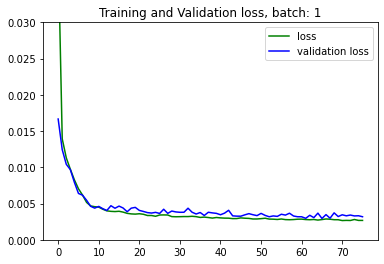

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 943ms/step - loss: 0.0034 - val_loss: 0.0035
Epoch 2/300
27/27 [==============================] - 25s 941ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 3/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0031 - val_loss: 0.0032
Epoch 4/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0030 - val_loss: 0.0033
Epoch 5/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0028 - val_loss: 0.0035
Epoch 6/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 7/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0029 - val_loss: 0.0029

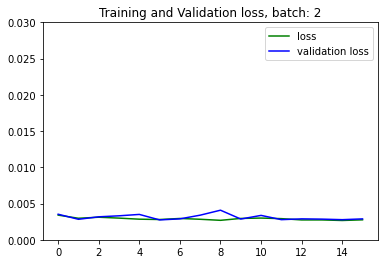

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 944ms/step - loss: 0.0029 - val_loss: 0.0029
Epoch 2/300
27/27 [==============================] - 25s 941ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 3/300
27/27 [==============================] - 25s 943ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 4/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0024 - val_loss: 0.0025
Epoch 5/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0024 - val_loss: 0.0025
Epoch 6/300
27/27 [==============================] - 25s 946ms/step - loss: 0.0023 - val_loss: 0.0023
Epoch 7/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0024 - val_loss: 0.0024

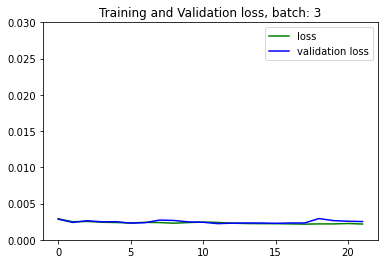

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 944ms/step - loss: 0.0023 - val_loss: 0.0023
Epoch 2/300
27/27 [==============================] - 25s 943ms/step - loss: 0.0022 - val_loss: 0.0022
Epoch 3/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0022 - val_loss: 0.0022
Epoch 4/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0022 - val_loss: 0.0023
Epoch 5/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0021 - val_loss: 0.0022
Epoch 6/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 7/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0022 - val_loss: 0.0021

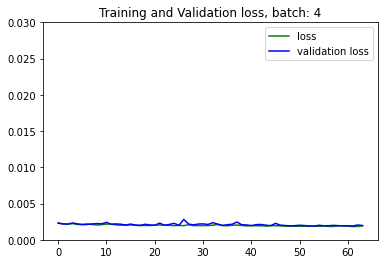

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 944ms/step - loss: 0.0023 - val_loss: 0.0026
Epoch 2/300
27/27 [==============================] - 25s 940ms/step - loss: 0.0020 - val_loss: 0.0022
Epoch 3/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0020 - val_loss: 0.0025
Epoch 4/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0020 - val_loss: 0.0023
Epoch 5/300
27/27 [==============================] - 25s 946ms/step - loss: 0.0019 - val_loss: 0.0024
Epoch 6/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 7/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0020 - val_loss: 0.0023

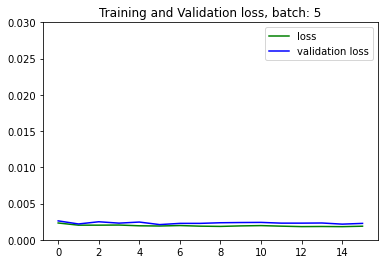

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 943ms/step - loss: 0.0024 - val_loss: 0.0025
Epoch 2/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0021 - val_loss: 0.0022
Epoch 3/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0021 - val_loss: 0.0024
Epoch 4/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0022 - val_loss: 0.0023
Epoch 5/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0020 - val_loss: 0.0024
Epoch 6/300
27/27 [==============================] - 25s 946ms/step - loss: 0.0021 - val_loss: 0.0023
Epoch 7/300
27/27 [==============================] - 25s 946ms/step - loss: 0.0021 - val_loss: 0.0023

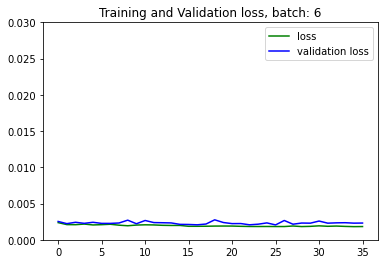

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 944ms/step - loss: 0.0023 - val_loss: 0.0023
Epoch 2/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 4/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 5/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 6/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 7/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0019 - val_loss: 0.0020

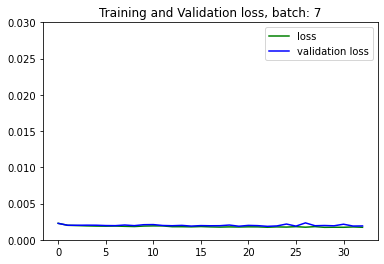

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 944ms/step - loss: 0.0022 - val_loss: 0.0024
Epoch 2/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0019 - val_loss: 0.0022
Epoch 3/300
27/27 [==============================] - 25s 943ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 4/300
27/27 [==============================] - 25s 946ms/step - loss: 0.0019 - val_loss: 0.0023
Epoch 5/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 6/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 7/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0018 - val_loss: 0.0020

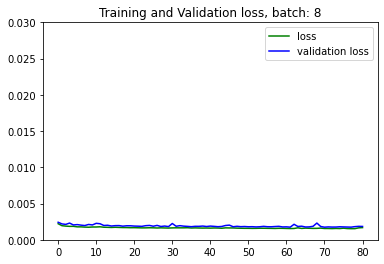

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 944ms/step - loss: 0.0026 - val_loss: 0.0029
Epoch 2/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0021 - val_loss: 0.0024
Epoch 3/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0021 - val_loss: 0.0025
Epoch 4/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0020 - val_loss: 0.0024
Epoch 5/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0019 - val_loss: 0.0025
Epoch 6/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0019 - val_loss: 0.0023
Epoch 7/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0020 - val_loss: 0.0024

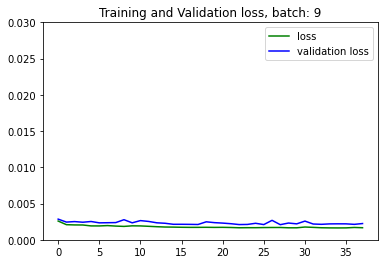

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 945ms/step - loss: 0.0027 - val_loss: 0.0027
Epoch 2/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0022 - val_loss: 0.0022
Epoch 3/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0021 - val_loss: 0.0023
Epoch 4/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0020 - val_loss: 0.0023
Epoch 5/300
27/27 [==============================] - 25s 943ms/step - loss: 0.0019 - val_loss: 0.0023
Epoch 6/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 7/300
27/27 [==============================] - 26s 948ms/step - loss: 0.0020 - val_loss: 0.0022

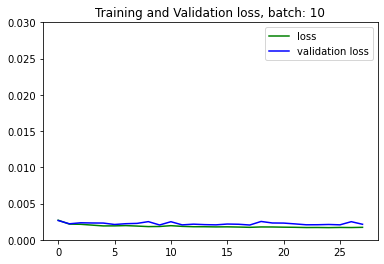

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0022 - val_loss: 0.0023
Epoch 2/300
27/27 [==============================] - 25s 943ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 3/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 4/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 5/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 6/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 7/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0017 - val_loss: 0.0019

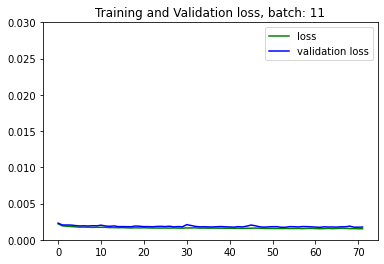

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 943ms/step - loss: 0.0022 - val_loss: 0.0023
Epoch 2/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3/300
27/27 [==============================] - 25s 941ms/step - loss: 0.0019 - val_loss: 0.0022
Epoch 4/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 5/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0019 - val_loss: 0.0022
Epoch 6/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 7/300
27/27 [==============================] - 26s 948ms/step - loss: 0.0019 - val_loss: 0.0020

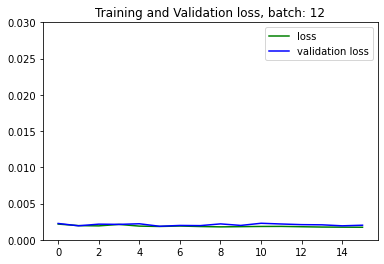

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0020 - val_loss: 0.0021
Epoch 2/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 3/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 4/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 5/300
27/27 [==============================] - 25s 946ms/step - loss: 0.0017 - val_loss: 0.0020
Epoch 6/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 7/300
27/27 [==============================] - 26s 948ms/step - loss: 0.0017 - val_loss: 0.0019

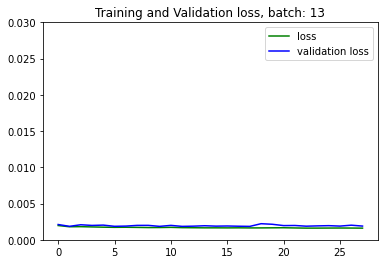

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 943ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 2/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 5/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 6/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 7/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0016 - val_loss: 0.0016

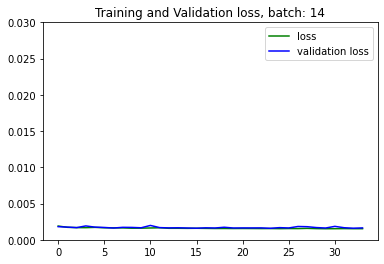

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 943ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 2/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 3/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 4/300
27/27 [==============================] - 25s 942ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 5/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0015 - val_loss: 0.0017
Epoch 6/300
27/27 [==============================] - 25s 945ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 7/300
27/27 [==============================] - 26s 948ms/step - loss: 0.0015 - val_loss: 0.0017

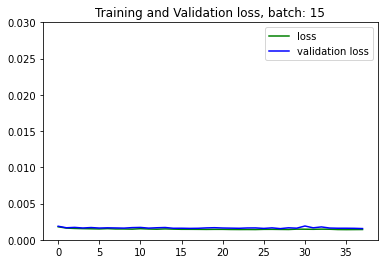

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 943ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 2/300
27/27 [==============================] - 25s 943ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 3/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 4/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0016 - val_loss: 0.0019
Epoch 5/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 6/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0016 - val_loss: 0.0018
Epoch 7/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0016 - val_loss: 0.0019

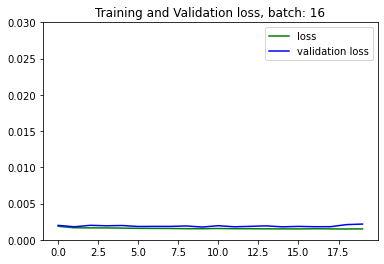

(30, 15, 172, 63, 13)
(30, 15, 172, 63, 46)
Epoch 1/300
27/27 [==============================] - 26s 943ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 2/300
27/27 [==============================] - 25s 940ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4/300
27/27 [==============================] - 25s 944ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 5/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 6/300
27/27 [==============================] - 26s 947ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 7/300
27/27 [==============================] - 26s 946ms/step - loss: 0.0016 - val_loss: 0.0017

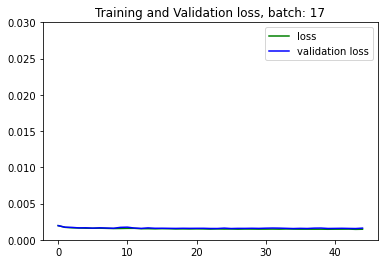

(6, 15, 172, 63, 13)
(6, 15, 172, 63, 46)
Epoch 1/300
5/5 [==============================] - 5s 999ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 2/300
5/5 [==============================] - 5s 988ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 3/300
5/5 [==============================] - 5s 987ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 4/300
5/5 [==============================] - 5s 988ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 5/300
5/5 [==============================] - 5s 985ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 6/300
5/5 [==============================] - 5s 988ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 7/300
5/5 [==============================] - 5s 988ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 8/300
5

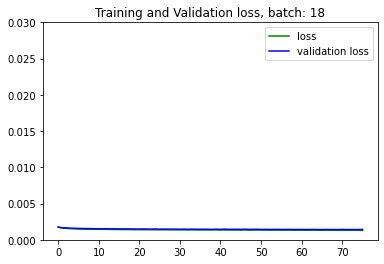

In [49]:
callback = tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=10)
#Train the model
convLSTM_model = create_model()

epochs = 300 

batch_num = 1

for x,y in combine_batches.take(18):
    print(np.shape([x_arr.numpy() for x_arr in x]))
    print(np.shape([y_arr.numpy() for y_arr in y]))
    history = convLSTM_model.fit(
        np.asarray([x_arr.numpy() for x_arr in x]),
        np.asarray([y_arr.numpy() for y_arr in y]),
        batch_size=1,
        epochs=epochs,
        verbose=1,
        validation_split=0.1,
        callbacks=[callback]
    )


    loss_train = history.history["loss"]
    loss_val = history.history['val_loss']

    plt.plot(loss_train, 'g', label='loss')
    plt.plot(loss_val, 'b', label='validation loss')
    plt.title('Training and Validation loss, batch: ' + str(batch_num))
    plt.ylim(0,0.03)
    plt.legend()
    plt.show()
    
    batch_num += 1


convLSTM_model.save('PretrainedModel/ConvLSTM_smoothed_NDVI_46stepahead_all_without_slope_linearactivate_tfAPI.h5')


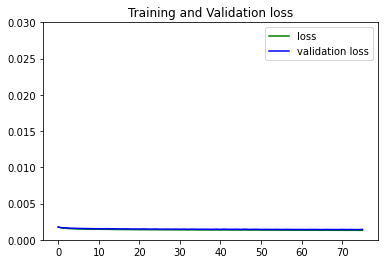

In [50]:
loss_train = history.history["loss"]
loss_val = history.history['val_loss']

plt.plot(loss_train, 'g', label='loss')
plt.plot(loss_val, 'b', label='validation loss')
plt.title('Training and Validation loss')

plt.ylim(0,0.03)
plt.legend()
plt.show()

In [43]:
convLSTM_model = tf.keras.models.load_model('PretrainedModel/ConvLSTM_smoothed_NDVI_46stepahead_all_without_slope_linearactivate_tfAPI.h5')
convLSTM_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d (ConvLSTM2D)    (None, None, 172, 63, 40) 76480     
_________________________________________________________________
conv_lst_m2d_1 (ConvLSTM2D)  (None, None, 172, 63, 40) 115360    
_________________________________________________________________
conv_lst_m2d_2 (ConvLSTM2D)  (None, None, 172, 63, 20) 43280     
_________________________________________________________________
conv_lst_m2d_3 (ConvLSTM2D)  (None, None, 172, 63, 10) 10840     
_________________________________________________________________
conv3d (Conv3D)              (None, None, 172, 63, 46) 12466     
Total params: 258,426
Trainable params: 258,426
Non-trainable params: 0
_________________________________________________________________


In [44]:
test_data_input.shape, test_data_label.shape

((172, 15, 172, 63, 13), (172, 15, 172, 63, 46))

In [45]:

def test_input_generator():
    for i in range(test_data_input.shape[0]):
        yield test_data_input[i]

def test_label_generator():
    for i in range(test_data_label.shape[0]):
        yield test_data_label[i]

In [46]:
test_input_dataset = tf.data.Dataset.from_generator(test_input_generator,output_types=tf.float32)
test_label_dataset = tf.data.Dataset.from_generator(test_label_generator,output_types=tf.float32)

In [47]:
test_input_batches = test_input_dataset.batch(30) #6 batches
test_label_batches = test_label_dataset.batch(30)

In [48]:
# Test the model performance based on the generated test data
predicition_result = []

for test_input in test_input_batches.take(6):
    a = np.asarray([x_arr.numpy() for x_arr in test_input])
    predicted = convLSTM_model.predict(a) 
    predicition_result.append(predicted)

#predicted = predicted[::, -1, ::, ::, :]   
#print("the shape of predicted data is " + str(predicted.shape))

In [49]:
np.shape(predicition_result[1])

(30, 15, 172, 63, 46)

In [50]:
prediction = np.empty((test_data_input.shape[0],15,172,63,step_ahead))

for k in range(5):
    for i in range(30):
        current_prediction_result = predicition_result[k]
        prediction[k*30+i,:,:,:,:] = current_prediction_result[i,:,:,:,:]

sixth_prediction_result = predicition_result[5]
for i in range(22):
    prediction[150+i,:,:,:,:] = sixth_prediction_result [i,:,:,:,:]

In [50]:
ground_truth = []
for test_label in test_label_batches.take(6):
    a = np.asarray([x_arr.numpy() for x_arr in test_label])
    ground_truth.append(a)

In [51]:
np.shape(ground_truth[0])

(30, 15, 172, 63, 46)

In [52]:
training_size = int(0.75*688)

In [53]:
training_size

516

In [51]:
from sklearn import metrics
from sklearn.metrics import mean_squared_error
#from keras_tuner.engine.hyperparameters import HyperParameters
import sklearn
def evaluate_method_performance(labeled_data, predicted, n_training_time_steps):
    n_test_time_steps = labeled_data.shape[0]
    time_step_ahead = labeled_data.shape[3]
    
    valid_label = []
    valid_predicted = []
    
    for t in range(n_test_time_steps):
        for m in range(172):
            for n in range(63):
                for a in range(time_step_ahead):
                    if qa_arr[n_training_time_steps+t+a,m,n] == 0 and ndvi_arr[n_training_time_steps+t+a,m,n]>0 and study_region_mask[m,n] == 1:
                        valid_label.append(labeled_data[t,m,n,a])
                        valid_predicted.append(predicted[t,m,n,a])
                        
    print("R squared is: "+str(sklearn.metrics.r2_score(valid_label,valid_predicted)))
    print("RMSE is: "+str(mean_squared_error(valid_label,valid_predicted, squared=False)))

In [52]:
prediction = prediction[:,-1,:,:,:]
test_data_label=test_data_label[:,-1,:,:,:]
print(test_data_label.shape)
evaluate_method_performance(test_data_label, prediction,initial_ndvi.shape[0])

(172, 172, 63, 46)
R squared is: 0.4286497507365963
RMSE is: 0.0982761496015793


In [53]:
valid_testlabel = []
valid_predicted = []

for count in range(0,5):
    label = ground_truth[count]
    prediction = predicition_result[count]
    for m in range(0,172):
        for n in range(0,63):
            for i in range(training_size+1+30*count,training_size+1+30*(count+1)):
                if qa_arr[i,m,n] == 0 and ndvi_arr[i,m,n]>0 and study_region_mask[m,n] == 1:
                    print(i)
                    print(i-training_size-1-30*count)
                    valid_testlabel.append(label[i-training_size-1-30*count,:,m,n])
                    valid_predicted.append(prediction[i-training_size-1-30*count,:,m,n])

label5 = ground_truth[5]
prediction5 = predicition_result[5]
for m in range(0,172):
    for n in range(0,63):
        for i in range(training_size+1+150,688):
            if qa_arr[i,m,n] == 0 and ndvi_arr[i,m,n]>0 and study_region_mask[m,n] == 1:
                valid_testlabel.append(label5[i-training_size-1-150,:,m,n])
                valid_predicted.append(prediction5[i-training_size-1-150,:,m,n])

print(np.shape(valid_testlabel))
print(np.shape(valid_predicted))

519
2
519
2
528
11
540
23
530
13
530
13
524
7
528
11
530
13
528
11
540
23
530
13
530
13
529
12
528
11
546
29
528
11
530
13
543
26
546
29
528
11
540
23
543
26
528
11
540
23
543
26
530
13
543
26
530
13
530
13
518
1
520
3
537
20
520
3
528
11
530
13
543
26
546
29
520
3
528
11
530
13
543
26
546
29
520
3
528
11
543
26
520
3
528
11
543
26
520
3
528
11
543
26
529
12
530
13
543
26
517
0
523
6
527
10
529
12
528
11
546
29
520
3
528
11
530
13
543
26
546
29
520
3
528
11
530
13
543
26
546
29
520
3
528
11
543
26
520
3
528
11
543
26
529
12
530
13
543
26
517
0
523
6
527
10
529
12
545
28
520
3
543
26
545
28
520
3
543
26
545
28
520
3
543
26
545
28
520
3
543
26
545
28
523
6
529
12
531
14
543
26
545
28
517
0
523
6
524
7
527
10
517
0
523
6
524
7
527
10
517
0
523
6
531
14
541
24
546
29
517
0
523
6
531
14
541
24
546
29
517
0
518
1
523
6
531
14
541
24
546
29
517
0
518
1
523
6
531
14
541
24
546
29
545
28
545
28
520
3
543
26
545
28
520
3
543
26
545
28
520
3
543
26
545
28
523
6
529
12
531
14
543
26
545
28
517
0
5

In [55]:
valid_testlabel = np.asarray(valid_testlabel)
valid_predicted = np.asarray(valid_predicted)

In [56]:
# Performance of the ConvLSTM model
from sklearn.metrics import mean_squared_error
#rmse =  mean_squared_error(valid_testlabel.flatten(), valid_predicted.flatten(), squared=False)
rmse =  mean_squared_error(valid_testlabel.ravel(), valid_predicted.ravel(), squared=False)
rmse


0.09660431

In [57]:
import sklearn
from sklearn import metrics
r2 = sklearn.metrics.r2_score(valid_testlabel.ravel(),valid_predicted.ravel())
print(r2)

0.4485013479595762


In [58]:
n_steps = 15
def plot_series(series, y=None, y_pred=None, x_label="$t$", y_label="$x(t)$", legend=True):
    plt.plot(series, ".-")
    if y is not None:
        plt.plot(n_steps, y, "bo", label="Target")
    if y_pred is not None:
        plt.plot(n_steps, y_pred, "rx", markersize=10, label="Prediction")
    plt.grid(True)
    if x_label:
        plt.xlabel(x_label, fontsize=16)
    if y_label:
        plt.ylabel(y_label, fontsize=16, rotation=0)
    plt.hlines(0, 0, 100, linewidth=1)
    plt.axis([0, n_steps + 1, -1, 1])
    if legend and (y or y_pred):
        plt.legend(fontsize=14, loc="upper left")

In [61]:
valid_testlabel.shape

(417390, 15, 46)

In [ ]:
# draw a pic to show the prediction
ahead = step_ahead
plot_series(test_data_input[75,:,105, 30, 0])
plt.plot(np.arange(n_steps, n_steps + ahead), test_data_label[75,-1,105, 30,:], "bo-", label="Actual")
plt.plot(np.arange(n_steps, n_steps + ahead), valid_predicted[75,-1,105, 30,:], "rx-", label="Forecast", markersize=10)
plt.axis([0, n_steps + ahead, -1, 1])
plt.legend(fontsize=14)

In [ ]:
fig, axes = plt.subplots(3,4, figsize=(22,14))
fig.tight_layout(pad=4.0)
for i in range(12):
    plt.subplot(3,4,i+1)
    random_height = random.randint(0,172-1)
    random_width = random.randint(0,63-1)
    step = random.randint(0,test_data_input.shape[0]-1)

    while study_region_mask[random_height,random_width] == -1:
        random_height = random.randint(0,171)
        random_width = random.randint(0,63)
        step = random.randint(0,test_data_input.shape[0]-1)

    #step = 75
    #print(random_height)
    #print(random_width)
    #print(step)
    # draw a pic to show the prediction
    ahead = step_ahead
    plot_series(test_data_input[step,:,random_height, random_width, 0])
    #plt.subplot(2,3,i+1)
    plt.plot(np.arange(n_steps, n_steps + ahead), test_data_label[step,-1,random_height, random_width,:], "bo-", label="Actual")
    plt.plot(np.arange(n_steps, n_steps + ahead), predicted[step,-1,random_height, random_width,:], "rx-", label="Forecast", markersize=10)
    plt.axis([0, n_steps + ahead, -1, 1])
    plt.legend(fontsize=14)
    plt.grid("on")
    plt.title("row: " + str(random_height) + "column: " + str(random_width))